# Notebook summary of work 

In [14]:
parent_folder_path = "/Users/haleyoro/Desktop/" # work on library computer
# parent_folder_path = "/Users/Haley/Desktop/Neuroscience Lab/Repository/" # work on local computer

In [15]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyabf

Looking at the waveforms (from `Plotting` folder)

In [ ]:
print("Pandas version:", pd.__version__)
print("NumPy version:", np.__version__)

Pandas version: 2.2.3
NumPy version: 2.2.6


Annotations sheet --`App Script`--> unformatted csv files 

unformatted csv files --`process_excel`--> formatted csv files 

## `annotations_loader` : Make `sheets` dict with 38 dataframes of all processed .csvs

Load the cell types data frame to include info when reading .csv sheets

In [39]:
cell_types_df = pd.read_csv(parent_folder_path+"murray-neuroscience-lab/Excel processor/List of cells.csv")
cell_types_df = cell_types_df.dropna(how='all')
cell_types_df = cell_types_df.iloc[:,:4]
cell_types_df.reset_index(drop=True,inplace=True)
sheets_types = cell_types_df["Cell"].unique().tolist()
print("Number of labeled sheets:",len(sheets_types))

Number of labeled sheets: 29


Create a dictionary looping through sheet names to load each sheet annotation as a data frame 
(.csv files were re-formatted using functions in `process_excel`, looping through the downloaded excel sheets from the annotations sheet in google drive. excel sheets were downloaded as .csvs using App Script code)

In [42]:
sheet_names_df = pd.read_csv(parent_folder_path+'murray-neuroscience-lab/Processed CSVs/sheet_names.csv', header=None)
sheet_names = sheet_names_df.iloc[:,0].values
sheets = {}

for sheet in sheet_names:
    file_path = parent_folder_path+"murray-neuroscience-lab/New processed excels/"+sheet+".csv"
    df = pd.read_csv(file_path)
    df[["Trace name","Tags","Type"]] = df[["Trace name","Tags","Type"]].astype("string")
    if sheet in sheets_types:
        types = cell_types_df[cell_types_df["Cell"]==sheet]
        if not df.empty:
            df.loc[:,"Cell Type"] = types.iloc[0]["Cell Type"]
            df.loc[:,"Input Resistance"] = types.iloc[0]["Input Resistance"]
            df.loc[:,"Motoneuron"] = types.iloc[0]["Motoneuron"]
    sheets[sheet] = df

sheets

{'2012_04_25_cell1':           Trace name  ID  On time     Freq               Tags        Type  \
 0    2012_04_25_0004   1  1285.99      NaN  bout start; shock  Inhibitory   
 1    2012_04_25_0004   2  1305.92  50.1756               <NA>  Inhibitory   
 2    2012_04_25_0004   3  1340.95  28.5470               <NA>  Inhibitory   
 3    2012_04_25_0004   4  1371.30  32.9489               <NA>  Inhibitory   
 4    2012_04_25_0004   5  1405.23  29.4724           bout end  Inhibitory   
 ..               ...  ..      ...      ...                ...         ...   
 153  2012_04_25_0002  13  4726.57  39.7141               <NA>  Excitatory   
 154  2012_04_25_0002  14  4755.30  34.8068               <NA>  Excitatory   
 155  2012_04_25_0002  15  4780.80  39.2157               <NA>  Excitatory   
 156  2012_04_25_0002  16  4808.89  35.5999               <NA>  Excitatory   
 157  2012_04_25_0002  17  4846.59  26.5252           bout end  Excitatory   
 
      Seconds Cell Type  Input Resistance 

In [41]:
unlabeled = list(set(sheet_names) - set(sheets_types))
print("Unlabeled annotation sheets:", unlabeled)


Unlabeled annotation sheets: ['2012_10_04_cell1', '2012_06_22_cell3', '2013_03_21_cell2', '2012_12_06_cell2', '2012_12_06_cell5', '2012_06_25_cell3', '2012_04_27_cell1', '2012_12_06_cell3', '2012_12_06_cell6', '2012_12_04_cell2']


Keys are names of sheets

In [20]:
print("Number of sheets:", len(sheets.keys()))
print("Number of labeled sheets:",len(sheets_types))
sheets.keys()

Number of sheets: 39
Number of labeled sheets: 29


dict_keys(['2012_04_25_cell1', '2012_04_25_cell3', '2012_04_27_cell1', '2012_06_22_cell3', '2012_06_25_cell3', '2012_06_29', '2012_08_01_cell1', '2012_08_01_cell3', '2012_08_07', '2012_08_31_cell1', '2012_08_31_cell2', '2012_08_31_cell3', '2012_08_31_cell4', '2012_10_04_cell2', '2012_12_03_cell1', '2012_12_04_cell1', '2012_12_04_cell2', '2012_12_05_cell1', '2012_12_05_cell3', '2012_12_05_cell4', '2012_12_06_cell1', '2012_12_06_cell2', '2012_12_06_cell3', '2012_12_06_cell4', '2012_12_06_cell5', '2012_12_06_cell6', '2013_03_20_cell1', '2013_03_21_cell1', '2013_03_21_cell2', '2013_03_21_cell3', '2013_03_21_cell4', '2013_03_21_cell5', '2013_03_22_cell1', '2013_03_22_cell2', '2013_03_22_cell3', '2013_03_22_cell4', '2013_03_22_cell5', '2013_03_22_cell6', '2012_10_04_cell1'])

Using one sheet name to access the formatted dataframe of the annotations, includes cell type and resistance

In [21]:
sheets['2012_04_25_cell1'].head()

,Trace name,ID,On time,Freq,Tags,Type,Seconds,Cell Type,Input Resistance,Motoneuron
0,2012_04_25_0004,1,1285.99,NaN,bout start; shock,Inhibitory,1.28599,vRoP,74.45,primary
1,2012_04_25_0004,2,1305.92,50.1756,<NA>,Inhibitory,1.30592,vRoP,74.45,primary
2,2012_04_25_0004,3,1340.95,28.5470,<NA>,Inhibitory,1.34095,vRoP,74.45,primary
3,2012_04_25_0004,4,1371.30,32.9489,<NA>,Inhibitory,1.37130,vRoP,74.45,primary
4,2012_04_25_0004,5,1405.23,29.4724,bout end,Inhibitory,1.40523,vRoP,74.45,primary


Some don't have Cell Type	Input Resistance	Motoneuron columns since it is not in the list of cells spreadsheet

In [44]:
sheets['2013_03_21_cell2'].head()

,Trace name,ID,On time,Freq,Tags,Type,Seconds
0,2013_03_21_0009,1.0,8573.84,NaN,bout start; spontaneous,Cell-attached,8.57384
1,2013_03_21_0009,2.0,8628.92,18.1554,<NA>,Cell-attached,8.62892
2,2013_03_21_0009,3.0,8679.99,19.5810,<NA>,Cell-attached,8.67999
3,2013_03_21_0009,4.0,8723.59,22.9358,bout end,Cell-attached,8.72359
4,2013_03_21_0009,5.0,11015.75,0.4363,bout start; spontaneous,Cell-attached,11.01575


## `binwaves_` : make abfs dict to store .abf files for each of the 38 sheets

make `abfs` dict: contains the abf file of each trace in the annotation df sheet

need abfs[trace] and sheets[sheet[sheet["Trace name"]==Trace]]. test with one:

use loops in annotations loader to make mega dict

In [23]:
parent_folder_path

'/Users/haleyoro/Desktop/'

In [45]:
parent_folder_path_ABFS ="/Users/haleyoro/Desktop/more_abfs/"

In [46]:
more_abfs_names = pd.read_csv("/Users/haleyoro/Desktop/murray-neuroscience-lab/Excel processor/more_abfs.csv")
more_abfs_names = more_abfs_names["Missing files"].to_numpy()
more_abfs_names

array(['2013_03_22_0054.abf', '2012_12_04_0016.abf',
       '2012_12_06_0052.abf', ..., '2013_03_22_0041.abf',
       '2013_03_22_0056.abf', '2012_12_06_0059.abf'],
      shape=(84,), dtype=object)

In [47]:
more_abfs = [name.replace(".abf", "") for name in more_abfs_names]
more_abfs

['2013_03_22_0054',
 '2012_12_04_0016',
 '2012_12_06_0052',
 '2013_03_22_0055',
 '2012_12_06_0032',
 '2012_12_05_0010',
 '2013_03_21_0004',
 '2013_03_22_0011',
 '2012_12_06_0072',
 '2012_12_06_0051',
 '2012_12_05_0038',
 '2012_12_05_0055',
 '2012_12_06_0011',
 '2013_03_20_0005',
 '2012_12_04_0010',
 '2013_03_21_0052',
 '2013_03_22_0049',
 '2012_12_06_0053',
 '2013_03_21_0033',
 '2012_12_06_0069',
 '2012_12_06_0057',
 '2012_12_06_0068',
 '2012_12_06_0073',
 '2013_03_22_0050',
 '2012_12_06_0020',
 '2012_12_03_0006',
 '2012_12_05_0054',
 '2013_03_20_0003',
 '2012_12_05_0036',
 '2012_12_03_0011',
 '2012_12_03_0009',
 '2012_12_05_0007',
 '2012_12_05_0051',
 '2012_12_03_0007',
 '2012_12_06_0023',
 '2013_03_21_0047',
 '2012_12_05_0031',
 '2012_12_06_0034',
 '2013_03_20_0004',
 '2013_03_21_0034',
 '2012_12_05_0011',
 '2012_12_04_0023',
 '2013_03_21_0048',
 '2013_03_21_0012',
 '2013_03_22_0062',
 '2013_03_21_0025',
 '2012_12_04_0015',
 '2013_03_21_0026',
 '2013_03_22_0027',
 '2013_03_22_0016',


In [48]:
import os

trace = '2012_12_06_0059'
file_path2 = os.path.join(parent_folder_path_ABFS, trace + ".abf")
abf1 = pyabf.ABF(file_path2)
abf1

ABF (v2.0) with 3 channels (pA, mV, mV), sampled at 100.0 kHz, containing 5 sweeps, having no tags, with a total length of 1.00 minutes, recorded with protocol "RXPATCH_1XROOT_DLM". path=/Users/haleyoro/Desktop/more_abfs/2012_12_06_0059.abf

add nested dicts with abf files into `sheets` 

In [49]:
df

,Trace name,ID,On time,Freq,Tags,Type,Seconds
0,2012_10_04_0014,1,6562.43,NaN,<NA>,Cell-attached,6.56243
1,2012_10_04_0014,2,6583.00,48.6145,<NA>,Cell-attached,6.58300
2,2012_10_04_0014,3,6600.28,57.8704,<NA>,Cell-attached,6.60028
3,2012_10_04_0014,4,6620.58,49.2611,<NA>,Cell-attached,6.62058
4,2012_10_04_0014,5,6640.20,50.9684,<NA>,Cell-attached,6.64020
...,...,...,...,...,...,...,...
518,2012_10_04_0014,173,47521.17,467.2897,<NA>,Cell-attached (spiking),47.52117
519,2012_10_04_0014,174,47540.18,52.6039,<NA>,Cell-attached (spiking),47.54018
520,2012_10_04_0014,175,48078.73,1.8568,<NA>,Cell-attached (spiking),48.07873
521,2012_10_04_0014,176,48100.02,46.9704,<NA>,Cell-attached (spiking),48.10002


In [50]:
import os

for sheet in sheets.keys():
    df = sheets[sheet]
    traces = set(df["Trace name"].unique())  # unique trace names from sheet as a set for faster lookup
    
    abfs = {}
    for trace in more_abfs:
        if trace in traces:  # only proceed if trace is in the sheet traces
            file_path2 = os.path.join(parent_folder_path_ABFS, trace + ".abf")
            if os.path.isfile(file_path2):
                abf = pyabf.ABF(file_path2)
                abfs[trace] = abf
            else:
                print(f"Warning: File not found {file_path2}")

    sheets[sheet] = {
        "annotations": df,
        "abfs": abfs
    }



In [29]:
sheets

{'2012_04_25_cell1': {'annotations':           Trace name  ID  On time     Freq               Tags        Type  \
  0    2012_04_25_0004   1  1285.99      NaN  bout start; shock  Inhibitory   
  1    2012_04_25_0004   2  1305.92  50.1756               <NA>  Inhibitory   
  2    2012_04_25_0004   3  1340.95  28.5470               <NA>  Inhibitory   
  3    2012_04_25_0004   4  1371.30  32.9489               <NA>  Inhibitory   
  4    2012_04_25_0004   5  1405.23  29.4724           bout end  Inhibitory   
  ..               ...  ..      ...      ...                ...         ...   
  153  2012_04_25_0002  13  4726.57  39.7141               <NA>  Excitatory   
  154  2012_04_25_0002  14  4755.30  34.8068               <NA>  Excitatory   
  155  2012_04_25_0002  15  4780.80  39.2157               <NA>  Excitatory   
  156  2012_04_25_0002  16  4808.89  35.5999               <NA>  Excitatory   
  157  2012_04_25_0002  17  4846.59  26.5252           bout end  Excitatory   
  
       Seconds

`sheets` is now a dictionary with `annotations` dataframe and `abfs` dict.
sheet names are still the keys

In [30]:
#sheets['2012_04_25_cell1']

In [52]:
sheets['2013_03_21_cell3']["annotations"].head()

,Trace name,ID,On time,Freq,Tags,Type,Seconds,Cell Type,Input Resistance,Motoneuron
0,2013_03_21_0049,1,21148.96,NaN,bout start; shock,Excitatory,21.14896,CaP,33.0,primary
1,2013_03_21_0049,2,21188.59,25.2334,<NA>,Excitatory,21.18859,CaP,33.0,primary
2,2013_03_21_0049,3,21219.25,32.6158,<NA>,Excitatory,21.21925,CaP,33.0,primary
3,2013_03_21_0049,4,21246.64,36.5097,<NA>,Excitatory,21.24664,CaP,33.0,primary
4,2013_03_21_0049,5,21284.79,26.2123,<NA>,Excitatory,21.28479,CaP,33.0,primary


In [54]:
sheets['2013_03_21_cell3']["abfs"]

{'2013_03_21_0025': ABF (v2.0) with 3 channels (pA, mV, mV), sampled at 100.0 kHz, containing 5 sweeps, having no tags, with a total length of 1.00 minutes, recorded with protocol "Ch1PatchCh2Root_VClamp". path=/Users/haleyoro/Desktop/more_abfs/2013_03_21_0025.abf,
 '2013_03_21_0026': ABF (v2.0) with 3 channels (pA, mV, mV), sampled at 100.0 kHz, containing 5 sweeps, having no tags, with a total length of 1.00 minutes, recorded with protocol "Ch1PatchCh2Root_VClamp". path=/Users/haleyoro/Desktop/more_abfs/2013_03_21_0026.abf}

In [59]:
sheets['2013_03_21_cell5']["abfs"].keys()

dict_keys(['2013_03_21_0052', '2013_03_21_0047', '2013_03_21_0048'])

Check to see if all abfs successfully loaded

In [67]:
len(more_abfs)

84

In [60]:
all_equal = []
for sheet in sheets.keys():
    traces_abfs = sorted(sheets[sheet]["abfs"].keys())
    # annotations = sheets[sheet]["annotations"]
    # traces_annotated = sorted(annotations["Trace name"].unique().tolist())
    # print(num_traces_abfs,num_traces_annotated)
    num_equal = sorted(more_abfs) == sorted(traces_annotated)
    # is_equal = 
    all_equal.append(num_equal)
    # sum(num_traces_abfs == num_traces_annotated)
    # num_traces_annotations = 
sum(all_equal)==len(sheets.keys())

False

In [70]:
abf_names = []
abf_annotations = []
for sheet in sheets.keys():
    traces_abfs = sorted(sheets[sheet]["abfs"].keys())
    annotations = sheets[sheet]["annotations"]
    abf_names.extend(traces_abfs)
    traces_annotated = sorted(annotations["Trace name"].unique().tolist())
    abf_annotations.extend(traces_annotated) 
    # print(num_traces_abfs,num_traces_annotated)

    # sum(num_traces_abfs == num_traces_annotated)
    # num_traces_annotations = 

len(abf_names)


84

new abf files that are labeled

In [71]:
abf_names = []
abf_annotations = []
for sheet in sheets_types:
    traces_abfs = sorted(sheets[sheet]["abfs"].keys())
    annotations = sheets[sheet]["annotations"]
    abf_names.extend(traces_abfs)
    traces_annotated = sorted(annotations["Trace name"].unique().tolist())
    abf_annotations.extend(traces_annotated) 
    # print(num_traces_abfs,num_traces_annotated)

    # sum(num_traces_abfs == num_traces_annotated)
    # num_traces_annotations = 

len(abf_names)


63

In [ ]:
print(sheets.keys())
print(sheets_types)

dict_keys(['2012_04_25_cell1', '2012_04_25_cell3', '2012_04_27_cell1', '2012_06_22_cell3', '2012_06_25_cell3', '2012_06_29', '2012_08_01_cell1', '2012_08_01_cell3', '2012_08_07', '2012_08_31_cell1', '2012_08_31_cell2', '2012_08_31_cell3', '2012_08_31_cell4', '2012_10_04_cell2', '2012_12_03_cell1', '2012_12_04_cell1', '2012_12_04_cell2', '2012_12_05_cell1', '2012_12_05_cell3', '2012_12_05_cell4', '2012_12_06_cell1', '2012_12_06_cell2', '2012_12_06_cell3', '2012_12_06_cell4', '2012_12_06_cell5', '2012_12_06_cell6', '2013_03_20_cell1', '2013_03_21_cell1', '2013_03_21_cell2', '2013_03_21_cell3', '2013_03_21_cell4', '2013_03_21_cell5', '2013_03_22_cell1', '2013_03_22_cell2', '2013_03_22_cell3', '2013_03_22_cell4', '2013_03_22_cell5', '2013_03_22_cell6', '2012_10_04_cell1'])
['2013_03_21_cell5', '2013_03_22_cell6', '2013_03_22_cell2', '2012_08_31_cell2', '2012_08_31_cell1', '2012_08_31_cell3', '2013_03_21_cell4', '2012_08_01_cell3', '2013_03_22_cell1', '2013_03_20_cell1', '2013_03_21_cell1',

make_waveforms function on abfs in one sheet

In [78]:
traces_df_mkwf = sheets['2013_03_21_cell5']["annotations"]
abfs_mkwv = sheets['2013_03_21_cell5']["abfs"]
traces = traces_df_mkwf["Trace name"].unique().tolist()

In [79]:
abfs_mkwv

{'2013_03_21_0052': ABF (v2.0) with 3 channels (pA, mV, mV), sampled at 100.0 kHz, containing 5 sweeps, having no tags, with a total length of 1.00 minutes, recorded with protocol "Ch1PatchCh2Root_VClamp". path=/Users/haleyoro/Desktop/more_abfs/2013_03_21_0052.abf,
 '2013_03_21_0047': ABF (v2.0) with 3 channels (pA, mV, mV), sampled at 100.0 kHz, containing 5 sweeps, having no tags, with a total length of 1.00 minutes, recorded with protocol "Ch1PatchCh2Root_VClamp". path=/Users/haleyoro/Desktop/more_abfs/2013_03_21_0047.abf,
 '2013_03_21_0048': ABF (v2.0) with 3 channels (pA, mV, mV), sampled at 100.0 kHz, containing 5 sweeps, having no tags, with a total length of 1.00 minutes, recorded with protocol "Ch1PatchCh2Root_VClamp". path=/Users/haleyoro/Desktop/more_abfs/2013_03_21_0048.abf}

In [84]:
def make_waveforms(abf, df):
    '''
    Function that takes an abf file and a df of the annotations
    Returns a dictionary with waveforms labeled by their frequency, cell type, signal type, and rin
    '''

    # Build full trace across all sweeps
    full_time = []
    full_current = []
    for sweep in range(abf.sweepCount):
        abf.setSweep(sweepNumber=sweep, channel=0)
        sweep_time = abf.sweepX + sweep * abf.sweepLengthSec
        sweep_current = abf.sweepY
        full_time.append(sweep_time)
        full_current.append(sweep_current)

    # Flatten lists
    full_time = np.concatenate(full_time)
    full_current = np.concatenate(full_current)
    # Make dataframe 
    abf_df = pd.DataFrame({
        'Time': full_time,
        'Current': full_current
    })

    if "Seconds" not in df.columns:
        df["Seconds"] = pd.to_numeric(df["On time"], errors="coerce") * 0.001

    waveforms = {}
    for i in range(len(df) - 1):
        t_0 = df.iloc[i]["Seconds"]
        t_f = df.iloc[i + 1]["Seconds"]

        abf_waveform = abf_df[(abf_df["Time"] >= t_0) & (abf_df["Time"] <= t_f)].copy()
        # previous error
        if abf_waveform.empty:
            raise ValueError(
                f"abf_waveform is empty for index {i}, t_0={t_0}, t_f={t_f}, Trace name={df.iloc[i]['Trace name']}"
            )
            
        # Optional: Remove outliers (IQR method)
        Q1 = abf_waveform["Current"].quantile(0.25)
        Q3 = abf_waveform["Current"].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - iqr_multiplier * IQR
        upper = Q3 + iqr_multiplier * IQR
        abf_waveform = abf_waveform[(abf_waveform["Current"] >= lower) & (abf_waveform["Current"] <= upper)]

        if abf_waveform.empty:
            continue  


        # Add phase (0 to 1 across the segment)
        abf_waveform["Phase"] = (abf_waveform["Time"] - t_0) / (t_f - t_0)

        # Normalize Current
        y_max = abf_waveform["Current"].max()
        y_min = abf_waveform["Current"].min()
        abf_waveform["Normalized Current"] = (abf_waveform["Current"] - y_min) / (y_max - y_min)

        # Dict keys
        freq = 1 / (t_f - t_0)
        signal_type = df.iloc[i]["Type"]
        cell_type = df.iloc[i]["Cell Type"]
        fast_slow = df.iloc[i]["Motoneuron"]
        key = (freq, signal_type, cell_type, fast_slow)

        waveforms[key] = abf_waveform

    return waveforms


In [83]:
print(["Inhibitory (Rs compensation)"df_mkwv.loc[:,"Type"] 

405    Inhibitory (Rs compensation)
406    Inhibitory (Rs compensation)
407    Inhibitory (Rs compensation)
408    Inhibitory (Rs compensation)
409    Inhibitory (Rs compensation)
410    Inhibitory (Rs compensation)
411    Inhibitory (Rs compensation)
412    Inhibitory (Rs compensation)
413    Inhibitory (Rs compensation)
414    Inhibitory (Rs compensation)
415    Inhibitory (Rs compensation)
416    Inhibitory (Rs compensation)
417    Inhibitory (Rs compensation)
418    Inhibitory (Rs compensation)
419    Inhibitory (Rs compensation)
420    Inhibitory (Rs compensation)
421    Inhibitory (Rs compensation)
422    Inhibitory (Rs compensation)
423    Inhibitory (Rs compensation)
424    Inhibitory (Rs compensation)
425    Inhibitory (Rs compensation)
426    Inhibitory (Rs compensation)
427    Inhibitory (Rs compensation)
428    Inhibitory (Rs compensation)
429    Inhibitory (Rs compensation)
430    Inhibitory (Rs compensation)
431    Inhibitory (Rs compensation)
432    Inhibitory (Rs compen

In [85]:
waveforms = {}

for trace in abfs_mkwv.keys():
    abf_mkwv = abfs_mkwv[trace]
    # print(abf_mkwv)
    df_mkwv = traces_df_mkwf[traces_df_mkwf["Trace name"]==trace]
    # print(df_mkwv)

    waveforms = make_waveforms(abf_mkwv,df_mkwv)


In [86]:
waveforms.keys()

dict_keys([(np.float64(34.566194262011344), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(33.25573661456621), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.483050847457616), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(27.389756231169677), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(29.20560747663547), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(27.434842249657162), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(27.240533914464542), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.41310089804558), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.896180742334433), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.15062761506303), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(0.10802064058400278), 'Excitatory (Rs compensation)', 'CaP', 'primary'), (np.float64(36.4697301239956), 'Excitatory (Rs compensation)', 'CaP'

In [87]:
waveforms[(np.float64(34.566194262011344), 'Excitatory (Rs compensation)', 'CaP', 'primary')].head()

,Time,Current,Phase,Normalized Current
350468,3.50468,-799.255310,1.535047e-14,0.549816
350469,3.50469,-811.401306,3.456619e-04,0.540316
350470,3.50470,-823.303162,6.913239e-04,0.531007
350471,3.50471,-835.937439,1.036986e-03,0.521125
350472,3.50472,-849.182068,1.382648e-03,0.510765


In [88]:
all_waveforms = {}
for sheet in sheets_types: # using sheet_types instead of sheet_keys() since not all sheets are labeled
    # print(sheet)
    traces_df_mkwf = sheets[sheet]["annotations"]
    # print(traces_df_mkwf)
    abfs_mkwv = sheets[sheet]["abfs"]
    # print(abfs_mkwv)
    traces_df_mkwf = traces_df_mkwf[traces_df_mkwf["Type"] != "Cell-attached (spiking)"]
    traces = traces_df_mkwf["Trace name"].unique().tolist()
    # print(traces)
    for trace in abfs_mkwv.keys():

        abf_mkwv = abfs_mkwv[trace]
        # print(abf_mkwv)
        df_mkwv = traces_df_mkwf[traces_df_mkwf["Trace name"]==trace]
        # print(df_mkwv)

        waveforms = make_waveforms(abf_mkwv,df_mkwv)

        for key, value in waveforms.items():
            # combined_key = f"{sheet}_{trace}_{key}"  
            all_waveforms[key] = value
        

In [89]:
print(f"Number of waveforms from annotated abfs: {len(all_waveforms)}")

Number of waveforms from annotated abfs: 11557


To check if sweeps are concatanated correctly:

In [ ]:
abf = sheets['2012_12_06_cell4']["abfs"]['2012_12_06_0049']

In [90]:
print(list(all_waveforms.keys())[:5])


[(np.float64(70.57163020465765), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(37.13330857779412), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(29.629629629631626), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(25.393600812594386), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.773761713520752), 'Inhibitory (Rs compensation)', 'CaP', 'primary')]


Using Counter to count how many waveform trpes

In [91]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif freq >= 45:
        return "45+"
    else:
        return "<15"

def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    return cell_type
key_counts = Counter()

for freq, signal_type,cell_type, fast_slow in all_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    grouped_key = (freq_bin, signal_type, cell_type_gen, fast_slow)
    key_counts[grouped_key] += 1

print(f"Unique waveform types: {len(key_counts)}\n")

Unique waveform types: 75



In [92]:
key_counts

Counter({('25–35',
          'Excitatory (Rs compensation)',
          'iSMN',
          'High Rin Secondary'): 924,
         ('25–35', 'Excitatory (Rs compensation)', 'MiP', 'primary'): 910,
         ('25–35',
          'Inhibitory (Rs compensation)',
          'iSMN',
          'High Rin Secondary'): 770,
         ('25–35',
          'Inhibitory (Rs compensation)',
          'vSMN',
          'High Rin Secondary'): 621,
         ('15–25', 'Excitatory (Rs compensation)', 'MiP', 'primary'): 607,
         ('25–35', 'Excitatory (Rs compensation)', 'CaP', 'primary'): 545,
         ('25–35',
          'Excitatory (Rs compensation)',
          'vSMN ',
          'High Rin Secondary'): 519,
         ('15–25', 'Excitatory (Rs compensation)', 'CaP', 'primary'): 508,
         ('25–35',
          'Inhibitory (Rs compensation)',
          'vSMN ',
          'High Rin Secondary'): 463,
         ('25–35',
          'Excitatory (Rs compensation)',
          'vSMN',
          'High Rin Secondary'): 4

In [97]:
def bin_wave(onewave):
    # y_max = max(onewave["Current"])
    # y_min = min(onewave["Current"])
    # normalized = (onewave["Current"] - y_min) / (y_max - y_min)
    # onewave["Normalized Current"] = normalized
    # Make edges for the bin
    bins = np.linspace(0, 1, 51, endpoint = True)

    # Cut the phase into bins
    onewave['Phase Bin'] = pd.cut(onewave['Phase'], bins=bins, include_lowest=True)
    # print(onewave)

    # Group by the bins and calculate the average current
    # binned_avg = onewave.groupby(by='Phase Bin','Current')
    binned_avg = onewave.groupby('Phase Bin',observed=True)[['Current','Normalized Current']].mean().reset_index()
    # print(binned_avg)


    # Compute the center of each bin actually present in binned_avg
    bin_centers = binned_avg['Phase Bin'].apply(lambda x: x.mid)
    binned_avg['Phase'] = bin_centers
    return binned_avg

In [98]:
bin_table = bin_wave(all_waveforms[(np.float64(70.57163020465765), 'Inhibitory (Rs compensation)', 'CaP', 'primary')])
bin_table

,Phase Bin,Current,Normalized Current,Phase
0,"(-0.001, 0.02]",1907.458008,0.787905,0.0095
1,"(0.02, 0.04]",1921.434570,0.819959,0.0300
2,"(0.04, 0.06]",1894.522705,0.758239,0.0500
3,"(0.06, 0.08]",1840.310181,0.633909,0.0700
4,"(0.08, 0.1]",1790.163208,0.518902,0.0900
5,"(0.1, 0.12]",1737.340332,0.397758,0.1100
6,"(0.12, 0.14]",1650.146362,0.197788,0.1300
7,"(0.14, 0.16]",1669.402954,0.241951,0.1500
8,"(0.16, 0.18]",1643.962769,0.183607,0.1700
9,"(0.18, 0.2]",1649.372437,0.196014,0.1900


<Axes: xlabel='Phase'>

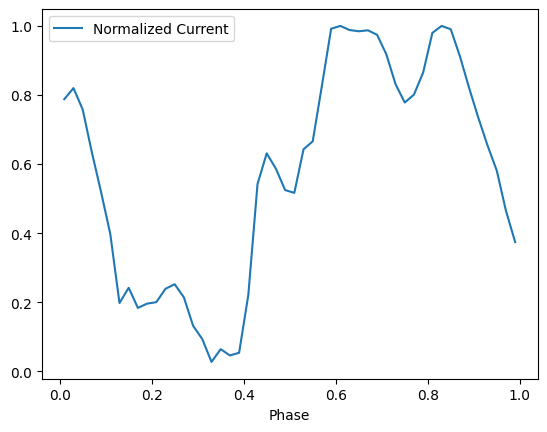

In [95]:
bin_table.plot("Phase","Normalized Current")

bin `all_waveforms` and store in `binned_waveforms`

In [100]:
binned_waveforms = {}
for wave in all_waveforms.keys():
    binned = bin_wave(all_waveforms[wave])
    binned_waveforms[wave] = binned

Save binned waveforms dict using pickle

In [101]:
binned_waveforms

{(np.float64(70.57163020465765),
  'Inhibitory (Rs compensation)',
  'CaP',
  'primary'):          Phase Bin      Current  Normalized Current   Phase
 0   (-0.001, 0.02]  1907.458008            0.787905  0.0095
 1     (0.02, 0.04]  1921.434570            0.819959  0.0300
 2     (0.04, 0.06]  1894.522705            0.758239  0.0500
 3     (0.06, 0.08]  1840.310181            0.633909  0.0700
 4      (0.08, 0.1]  1790.163208            0.518902  0.0900
 5      (0.1, 0.12]  1737.340332            0.397758  0.1100
 6     (0.12, 0.14]  1650.146362            0.197788  0.1300
 7     (0.14, 0.16]  1669.402954            0.241951  0.1500
 8     (0.16, 0.18]  1643.962769            0.183607  0.1700
 9      (0.18, 0.2]  1649.372437            0.196014  0.1900
 10     (0.2, 0.22]  1651.229736            0.200273  0.2100
 11    (0.22, 0.24]  1668.126465            0.239024  0.2300
 12    (0.24, 0.26]  1673.865112            0.252185  0.2500
 13    (0.26, 0.28]  1657.252686            0.214086  0.2

In [102]:
import pickle
# Save it to a file
with open("binned_waveforms_moreabfs.pkl", "wb") as f:
    pickle.dump(binned_waveforms, f)

print("Saved to binned_waveforms.pkl")


Saved to binned_waveforms.pkl


NEXT: access keys to average across the key types and plot
- current type: excitatory, inhibitory, cell-attached
- frequency bins: 15-25,25-35,35-45,45+
- rin: low/mid/high or fast/slow (for now sort by motoneuron class)
- cell type: CaP,vRoP,MiP,dRoP,dVS,dSMN,vSMN,iSMN

function(current,freq,rin,type) -> plot waveform

In [ ]:
binned_waveforms.keys()

dict_keys([(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary'), (np.float64(32.61578604044627), 'Excitatory', 'CaP', 'primary'), (np.float64(36.50967506389131), 'Excitatory', 'CaP', 'primary'), (np.float64(26.212319790300285), 'Excitatory', 'CaP', 'primary'), (np.float64(22.836263987212853), 'Excitatory', 'CaP', 'primary'), (np.float64(27.21829069134327), 'Excitatory', 'CaP', 'primary'), (np.float64(28.137310073156204), 'Excitatory', 'CaP', 'primary'), (np.float64(1.0798319781442016), 'Excitatory', 'CaP', 'primary'), (np.float64(40.78303425775046), 'Excitatory', 'CaP', 'primary'), (np.float64(40.35512510088814), 'Excitatory', 'CaP', 'primary'), (np.float64(41.562759767250895), 'Excitatory', 'CaP', 'primary'), (np.float64(45.955882352940236), 'Excitatory', 'CaP', 'primary'), (np.float64(138.1215469612683), 'Excitatory', 'CaP', 'primary'), (np.float64(54.495912806545185), 'Excitatory', 'CaP', 'primary'), (np.float64(38.88024883359292), 'Excitatory', 'CaP', 'primary'), (np.fl

In [ ]:
def average_waveforms_for_key(counter_key):
    '''
    Function that takes a counter key like ('15–25', 'Cell-attached', 'MiP', 'primary')
    Returns df of averaged waveform for that key
    '''
    #Separate key code
    freq_bin, signal_type,cell_type, fast_slow = counter_key
    
    dfs = [] # To store matching waveforms dataframes
    # loop through all binned waveforms
    for key in binned_waveforms.keys():
        freq, st,ct, fs = key
        # use get_freq_bin(freq) to turn float into bin, use group_iSMN() to generalize all iSMN
        if get_freq_bin(freq) == freq_bin and ct == group_iSMN(cell_type) and st == signal_type and fs == fast_slow:
            dfs.append(binned_waveforms[key].copy())
    # if no waveforms for key
    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None
    # combine all the data frames
    # print(len(dfs))
    combined = pd.concat(dfs)
    # print(combined.shape)
    averaged = combined.groupby('Phase Bin', observed=False).mean().reset_index()
    return averaged

In [ ]:
986*50

49300

In [ ]:
avg_table = average_waveforms_for_key(('15–25', 'Cell-attached', 'MiP', 'primary'))
avg_table.shape

(50, 4)

In [ ]:
key_counts

Counter({('15–25', 'Cell-attached', 'MiP', 'primary'): 986,
         ('25–35', 'Excitatory', 'vRoP', 'primary'): 881,
         ('25–35', 'Cell-attached', 'MiP', 'primary'): 878,
         ('15–25', 'Cell-attached', 'CaP', 'primary'): 794,
         ('25–35', 'Cell-attached', 'vRoP', 'primary'): 599,
         ('25–35', 'Inhibitory', 'dSMN', 'Low Rin Secondary '): 593,
         ('25–35', 'Inhibitory', 'vSMN', 'Low Rin Secondary '): 426,
         ('25–35', 'Inhibitory', 'vRoP', 'primary'): 417,
         ('25–35', 'Excitatory', 'MiP', 'primary'): 376,
         ('15–25', 'Cell-attached', 'iSMN', 'High Rin Secondary'): 352,
         ('25–35', 'Cell-attached', 'dSMN', 'Low Rin Secondary '): 330,
         ('25–35', 'Excitatory', 'vSMN', 'Low Rin Secondary '): 296,
         ('25–35', 'Inhibitory', 'MiP', 'primary'): 279,
         ('25–35', 'Excitatory', 'dSMN', 'Low Rin Secondary '): 269,
         ('25–35', 'Cell-attached', 'dRoP', 'primary'): 267,
         ('25–35', 'Cell-attached', 'vSMN ', 'Hi

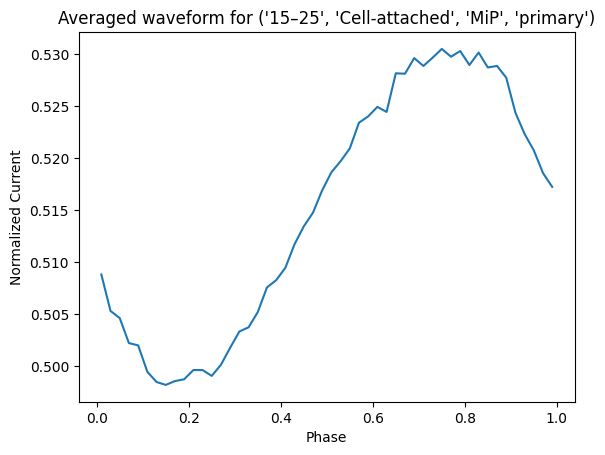

In [ ]:
# Use a key from Counter
example_key = ('15–25', 'Cell-attached', 'MiP', 'primary')

avg_waveform_df = average_waveforms_for_key(example_key)

if avg_waveform_df is not None:
    plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'])
    plt.xlabel('Phase')
    plt.ylabel('Normalized Current')
    plt.title(f'Averaged waveform for {example_key}')
    plt.show()


No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
Skipping: No data for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
Skipping: No data for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
Skipping: No data for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
Skipping: No data for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
Skipping: No data for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
Skipping: No data for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<1

/var/folders/mw/pz4gm95j6zb7syl48vm11wrw0000gn/T/ipykernel_14480/1820168028.py:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


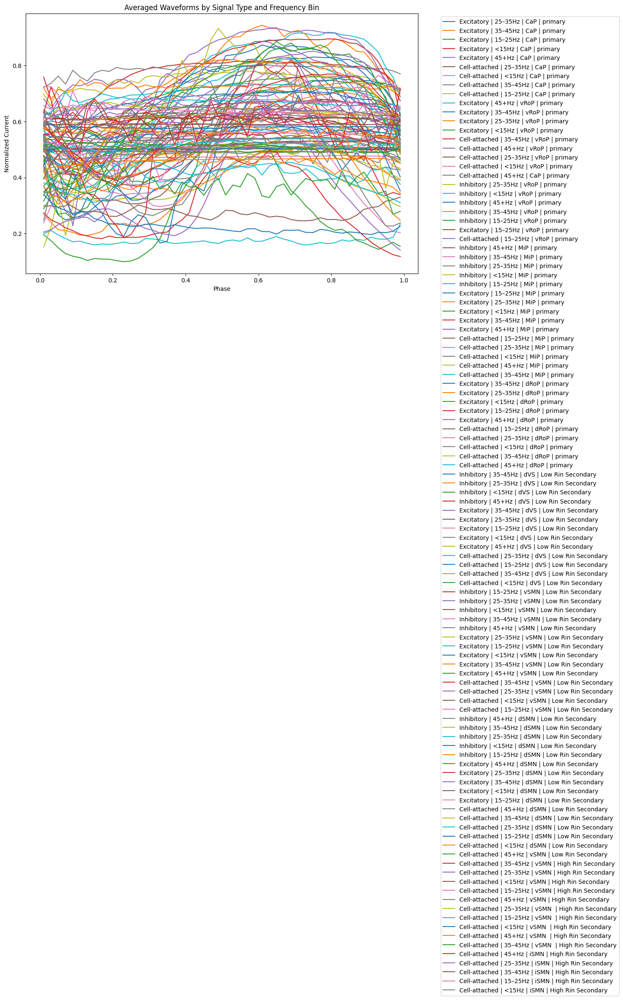

In [ ]:
plt.figure(figsize=(12, 8))

for key in key_counts:
    try:
        avg_waveform_df = average_waveforms_for_key(key)
        if avg_waveform_df is None or avg_waveform_df.empty:
            print(f"Skipping: No data for {key}")
            continue
        label = f"{key[1]} | {key[0]}Hz | {key[2]} | {key[3]}"
        plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label=label)
    except Exception as e:
        print(f"Skipping {key} due to error: {e}")
        continue

plt.xlabel('Phase')
plt.ylabel('Normalized Current')
plt.title('Averaged Waveforms by Signal Type and Frequency Bin')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


/var/folders/mw/pz4gm95j6zb7syl48vm11wrw0000gn/T/ipykernel_14480/3802899614.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))  # or use 'Set1', 'tab20', etc.


Plotting waveforms for swimming speed: primary


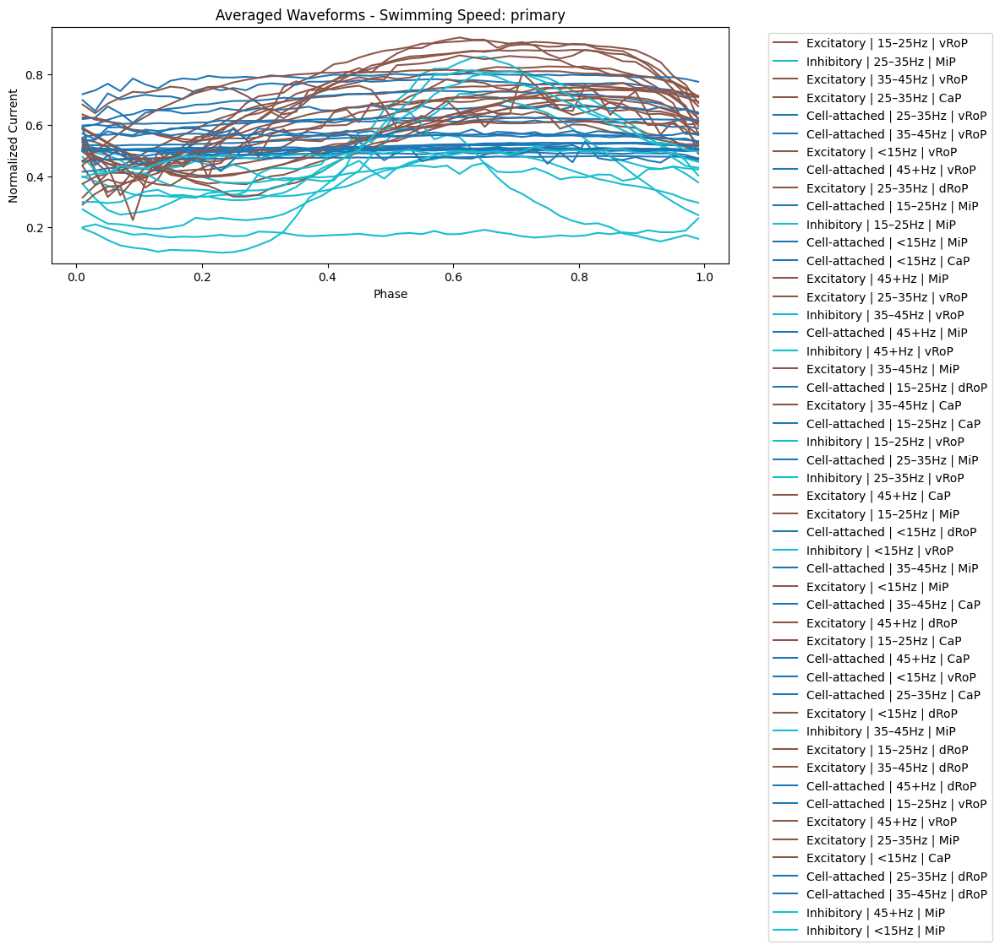

Plotting waveforms for swimming speed: Low Rin Secondary 


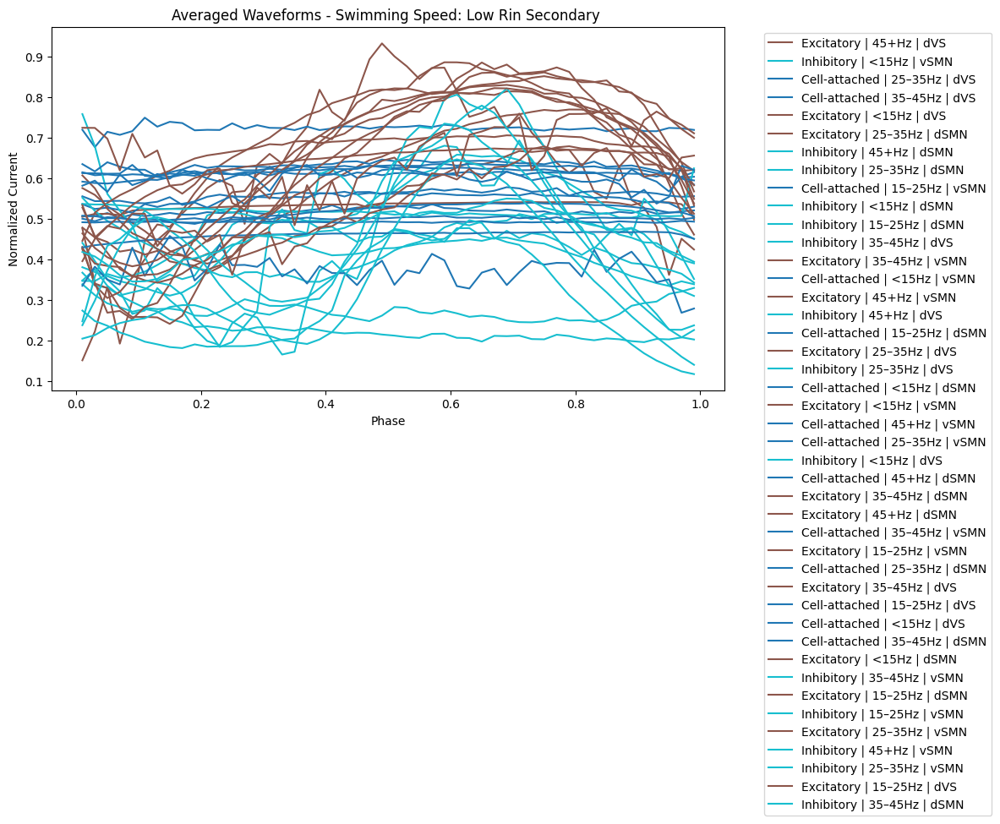

Plotting waveforms for swimming speed: High Rin Secondary
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('<15', 'Inhibitor

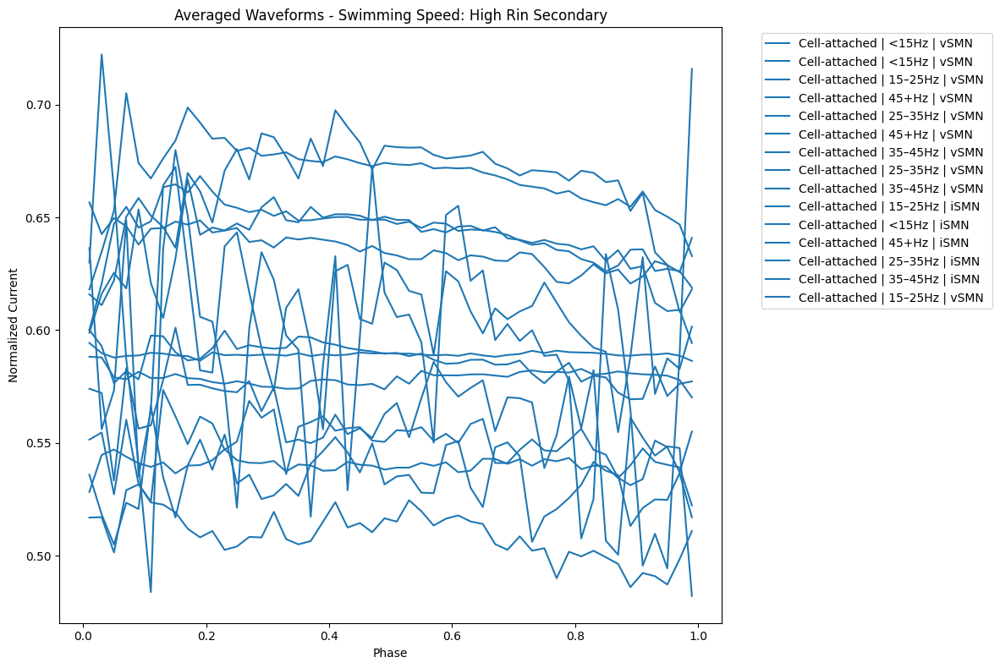

In [ ]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Step 1: Group waveform keys by fast_slow (swimming speed)
waveforms_by_speed = defaultdict(list)
signal_types = set()

for freq, signal_type, cell_type, fast_slow in all_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    grouped_key = (freq_bin, signal_type, cell_type_gen, fast_slow)
    waveforms_by_speed[fast_slow].append(grouped_key)
    signal_types.add(signal_type)

# Step 2: Assign a unique color to each signal type
cmap = cm.get_cmap('tab10', len(signal_types))  # or use 'Set1', 'tab20', etc.
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Step 3: Plot one figure per swimming speed, with color coding by signal type
for speed_category, keys in waveforms_by_speed.items():
    plt.figure(figsize=(12, 8))
    print(f"Plotting waveforms for swimming speed: {speed_category}")

    plotted_any = False
    for key in set(keys):
        try:
            avg_waveform_df = average_waveforms_for_key(key)
            if avg_waveform_df is None or avg_waveform_df.empty:
                print(f"  Skipping: No data for {key}")
                continue

            signal_type = key[1]
            color = signal_type_colors.get(signal_type, 'gray')  # default to gray if missing
            label = f"{signal_type} | {key[0]}Hz | {key[2]}"
            plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                     label=label, color=color)
            plotted_any = True
        except Exception as e:
            print(f"  Error with {key}: {e}")
            continue

    if plotted_any:
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f'Averaged Waveforms - Swimming Speed: {speed_category}')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
    else:
        print(f"  No valid waveforms to plot for {speed_category}")


Plotting waveforms for frequency bin '15–25' and swimming speed 'High Rin Secondary'
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('15–25', 'Inhibitory', 'iSMN', 'High Rin Secondary')


/var/folders/mw/pz4gm95j6zb7syl48vm11wrw0000gn/T/ipykernel_14480/2164276240.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))  # or use 'Set1', 'tab20', etc.


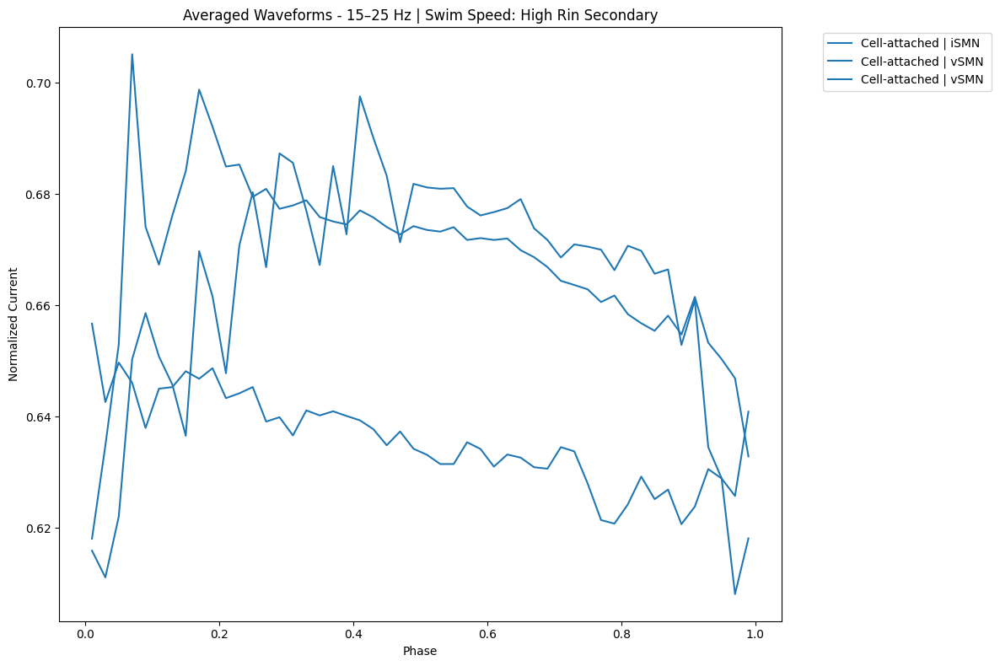

Plotting waveforms for frequency bin '15–25' and swimming speed 'Low Rin Secondary '


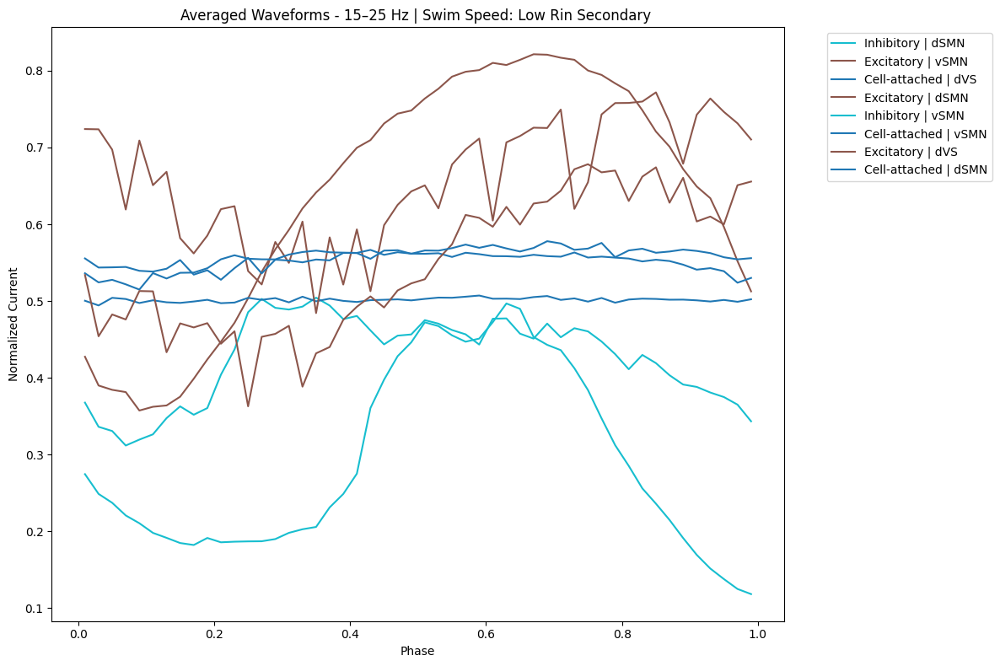

Plotting waveforms for frequency bin '15–25' and swimming speed 'primary'


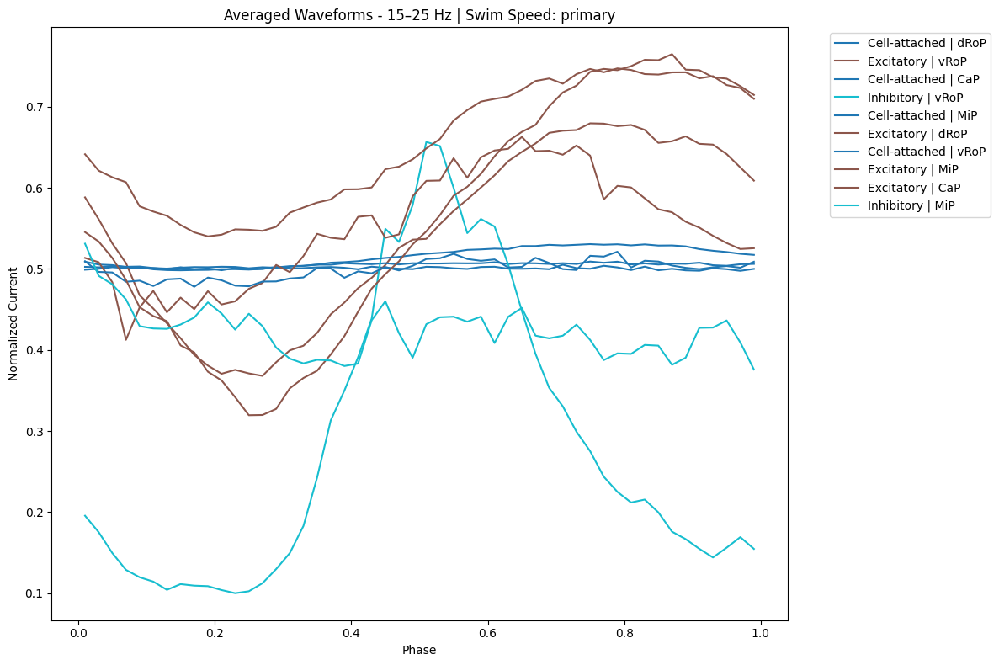

Plotting waveforms for frequency bin '25–35' and swimming speed 'High Rin Secondary'
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary')


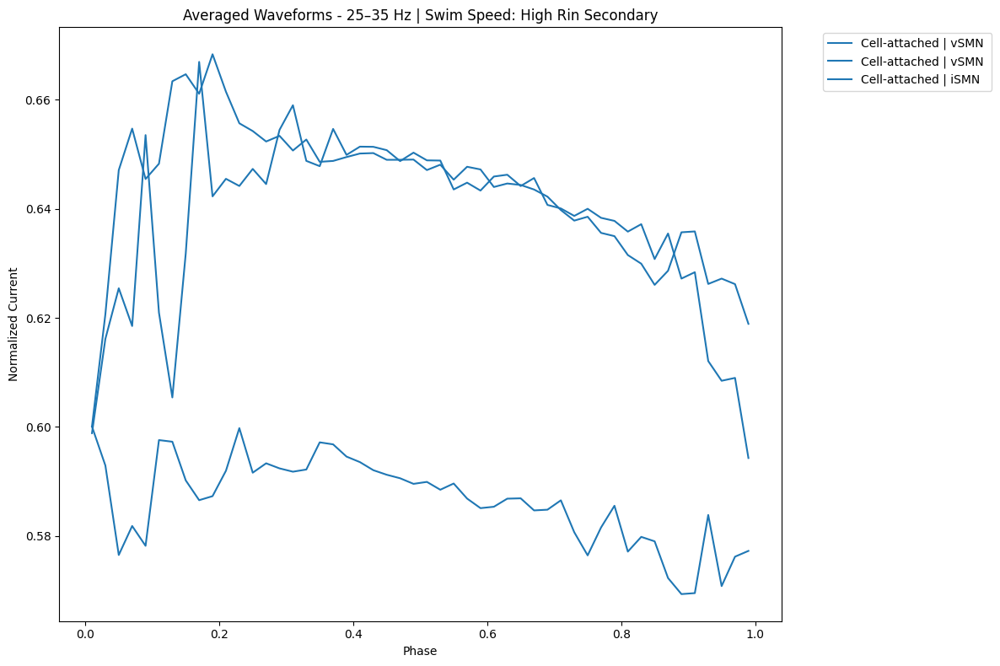

Plotting waveforms for frequency bin '25–35' and swimming speed 'Low Rin Secondary '


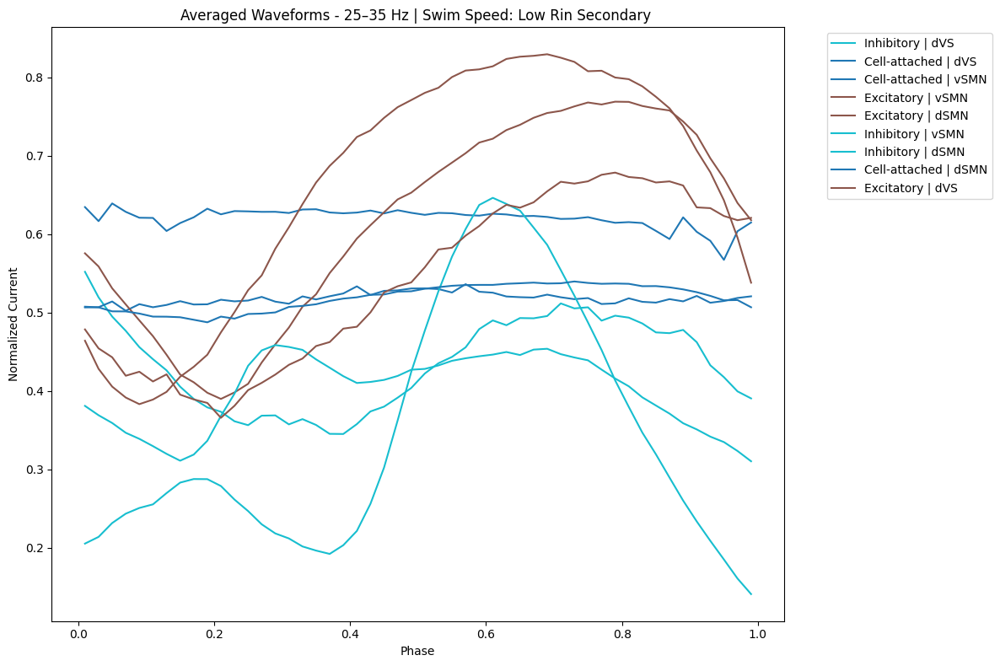

Plotting waveforms for frequency bin '25–35' and swimming speed 'primary'


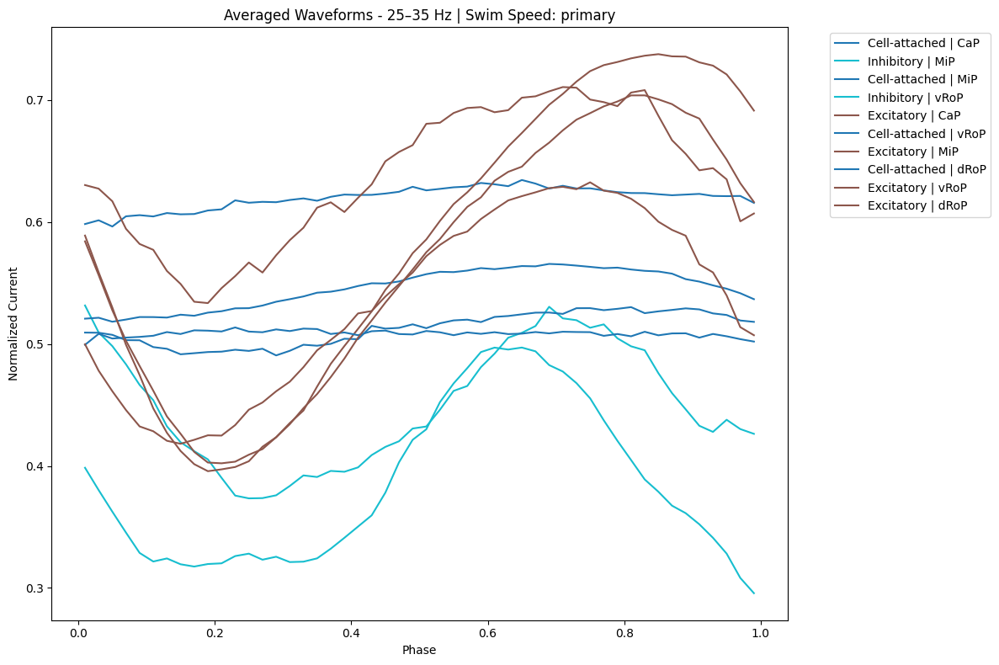

Plotting waveforms for frequency bin '35–45' and swimming speed 'High Rin Secondary'
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('35–45', 'Inhibitory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('35–45', 'Excitatory', 'iSMN', 'High Rin Secondary')


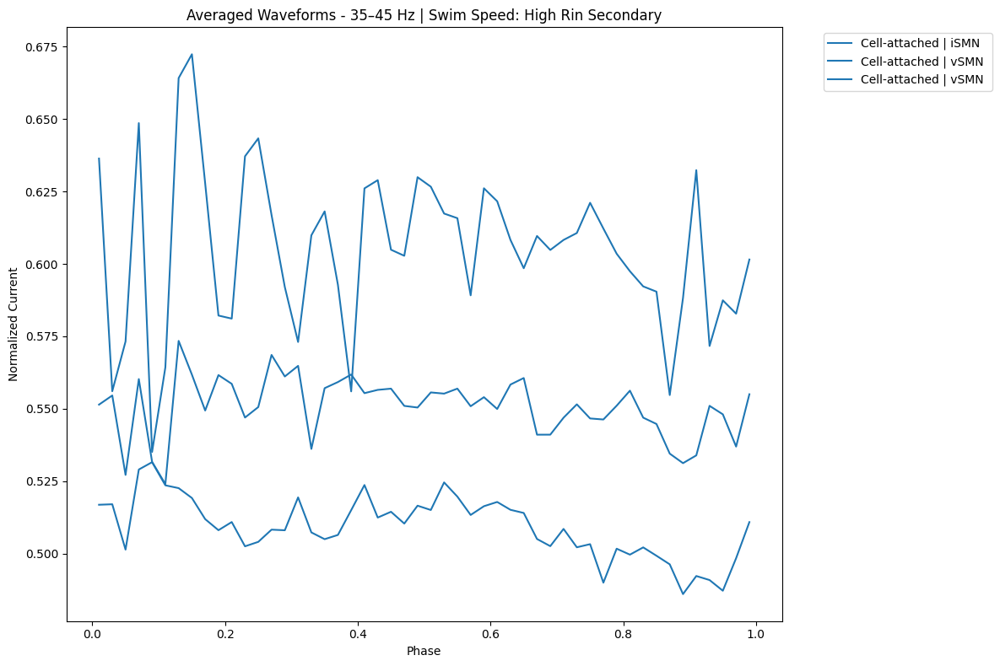

Plotting waveforms for frequency bin '35–45' and swimming speed 'Low Rin Secondary '


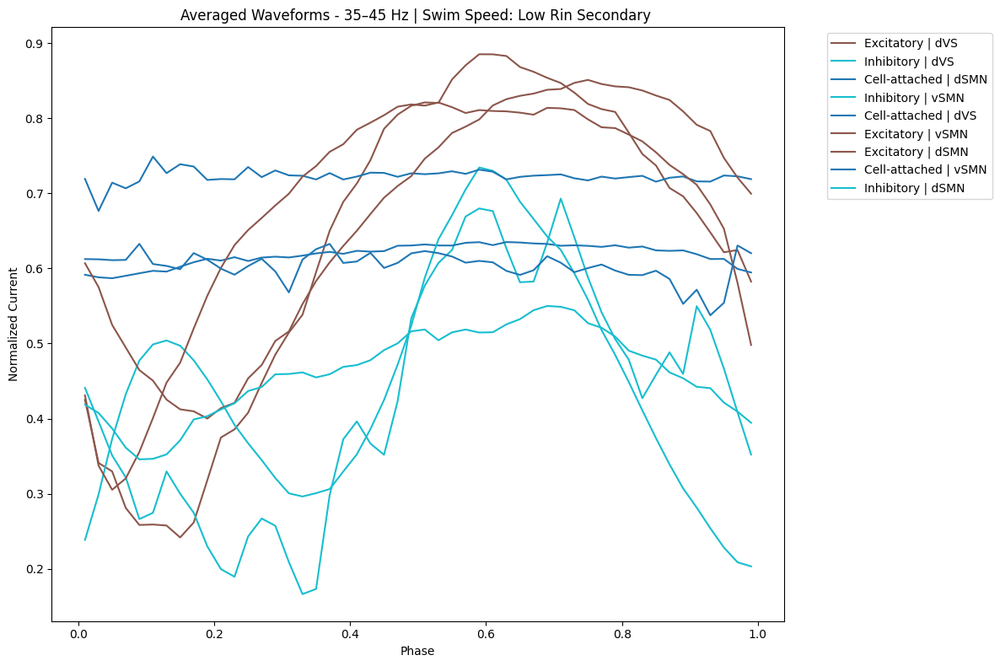

Plotting waveforms for frequency bin '35–45' and swimming speed 'primary'


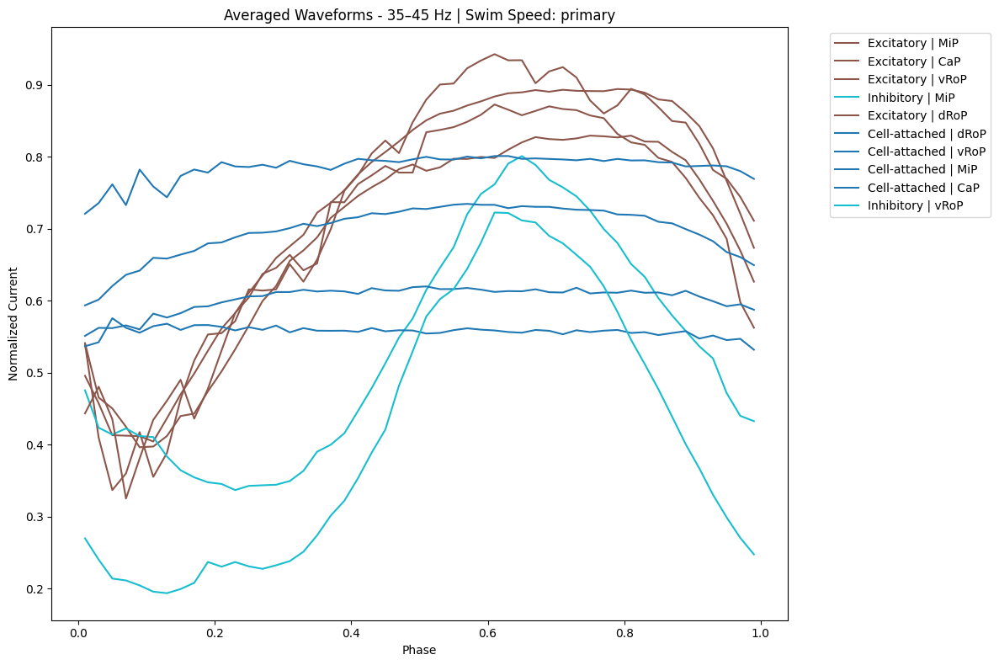

Plotting waveforms for frequency bin '45+' and swimming speed 'High Rin Secondary'
No matching waveforms found for ('45+', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('45+', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('45+', 'Inhibitory', 'iSMN', 'High Rin Secondary')


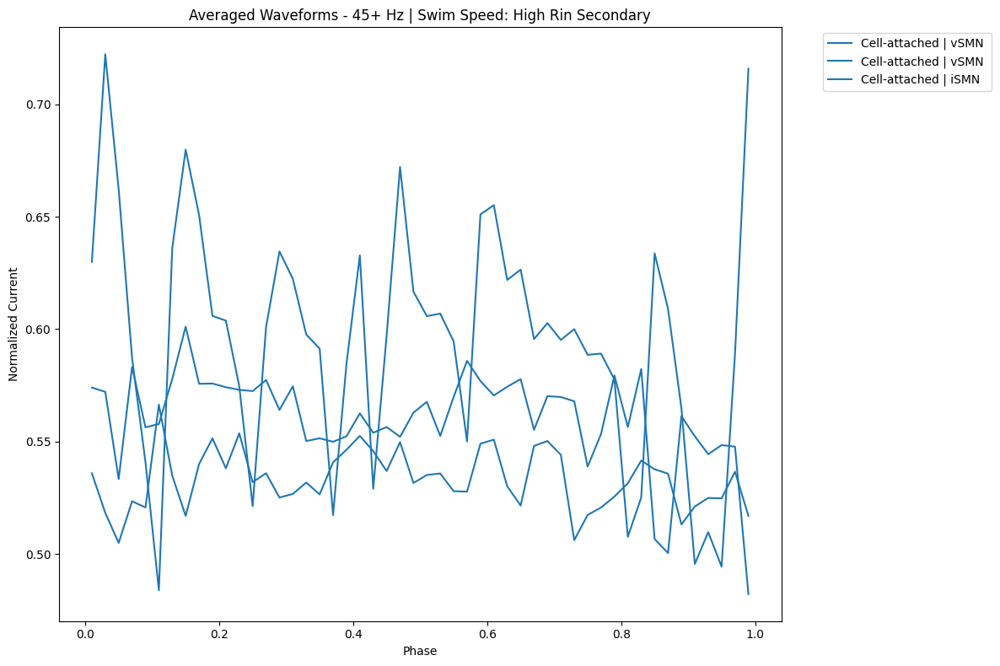

Plotting waveforms for frequency bin '45+' and swimming speed 'Low Rin Secondary '


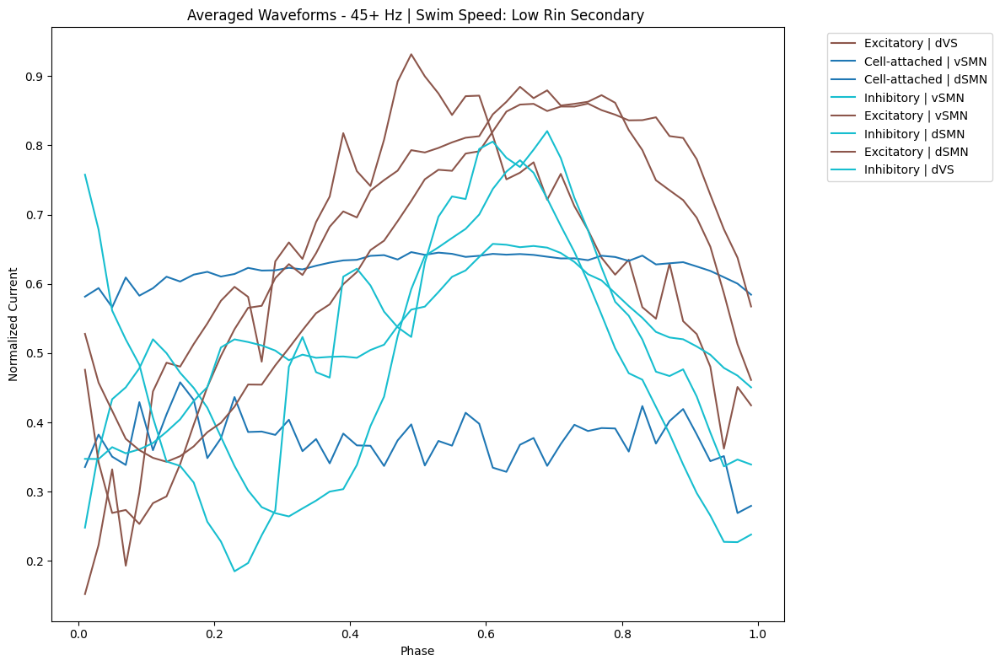

Plotting waveforms for frequency bin '45+' and swimming speed 'primary'


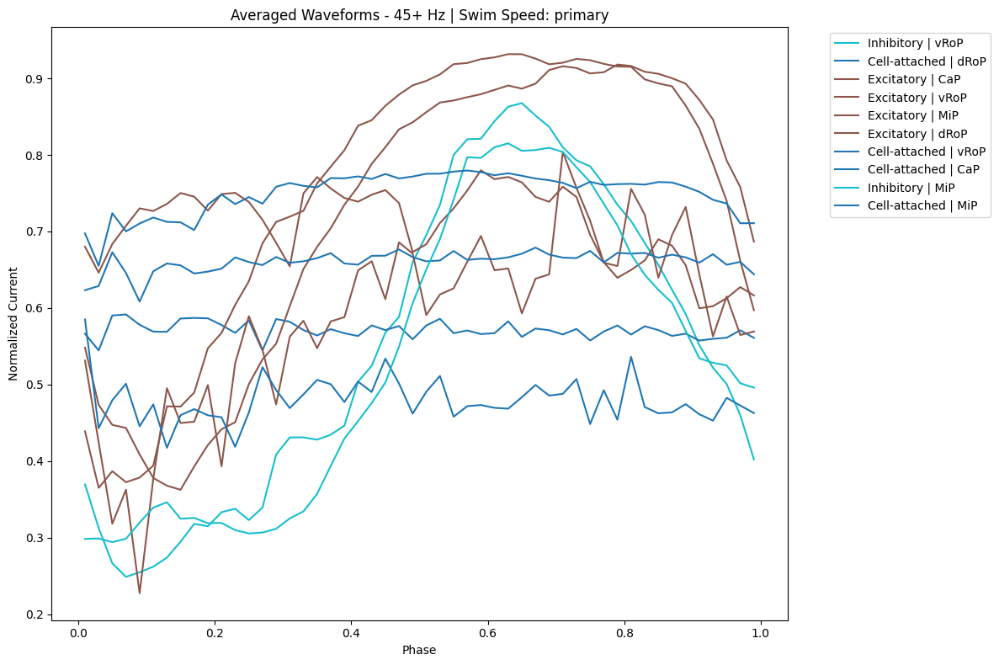

Plotting waveforms for frequency bin '<15' and swimming speed 'High Rin Secondary'
No matching waveforms found for ('<15', 'Excitatory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('<15', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')
  Skipping: No data for ('<15', 'Inhibitory', 'iSMN', 'High Rin Secondary')


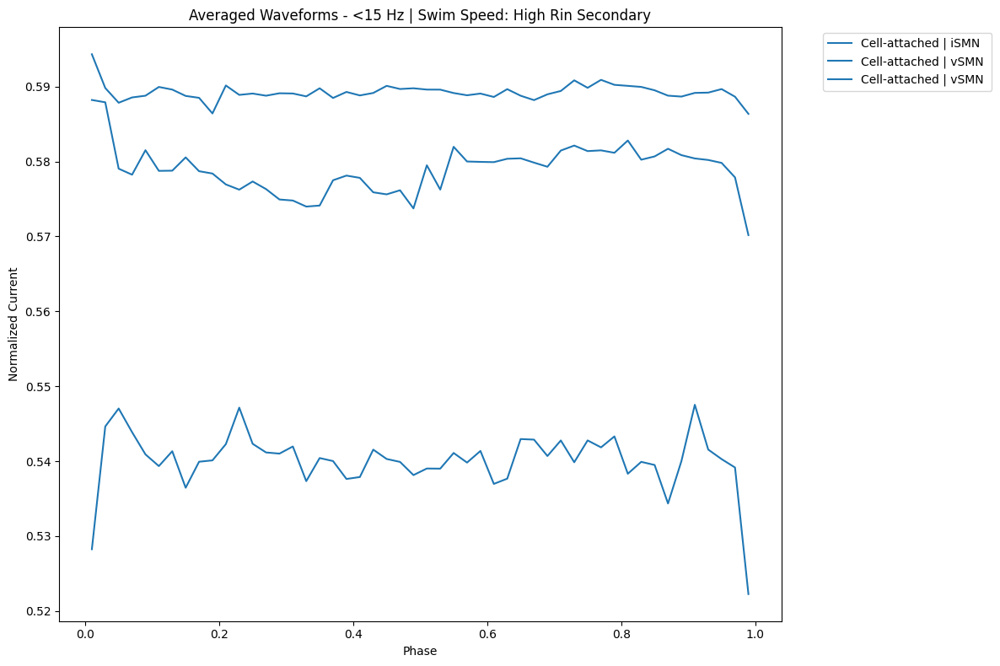

Plotting waveforms for frequency bin '<15' and swimming speed 'Low Rin Secondary '


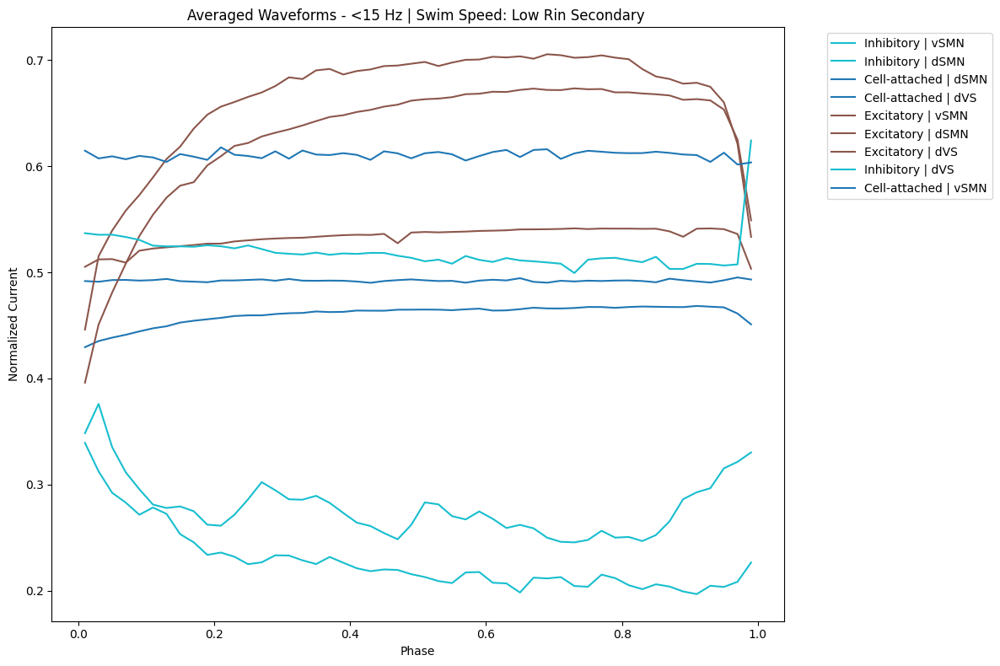

Plotting waveforms for frequency bin '<15' and swimming speed 'primary'


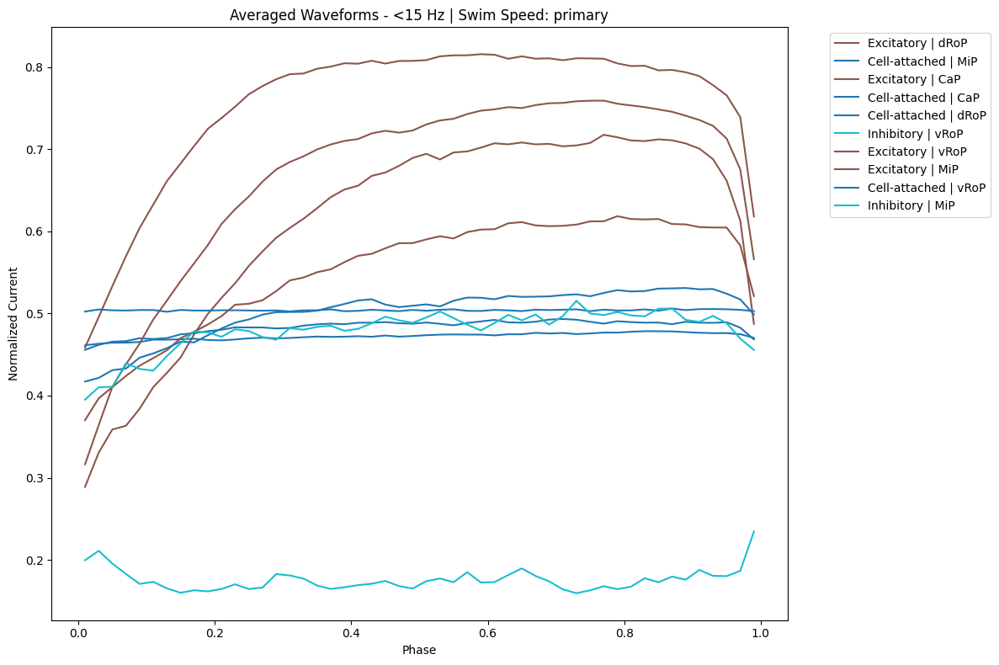

In [ ]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Step 1: Group waveform keys by (frequency_bin, swimming_speed)
waveforms_by_group = defaultdict(list)
signal_types = set()

for freq, signal_type, cell_type, fast_slow in all_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    grouped_key = (freq_bin, signal_type, cell_type_gen, fast_slow)
    group_key = (freq_bin, fast_slow)  # <--- group by freq + speed
    waveforms_by_group[group_key].append(grouped_key)
    signal_types.add(signal_type)

# Step 2: Assign colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))  # or use 'Set1', 'tab20', etc.
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Step 3: Plot each (frequency bin, swimming speed) group
for (freq_bin, speed_category), keys in sorted(waveforms_by_group.items()):
    plt.figure(figsize=(12, 8))
    print(f"Plotting waveforms for frequency bin '{freq_bin}' and swimming speed '{speed_category}'")

    plotted_any = False
    for key in set(keys):
        try:
            avg_waveform_df = average_waveforms_for_key(key)
            if avg_waveform_df is None or avg_waveform_df.empty:
                print(f"  Skipping: No data for {key}")
                continue

            signal_type = key[1]
            color = signal_type_colors.get(signal_type, 'gray')
            label = f"{signal_type} | {key[2]}"
            plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                     label=label, color=color)
            plotted_any = True
        except Exception as e:
            print(f"  Error with {key}: {e}")
            continue

    if plotted_any:
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f"Averaged Waveforms - {freq_bin} Hz | Swim Speed: {speed_category}")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
    else:
        print(f"  No valid waveforms to plot for ({freq_bin}, {speed_category})")


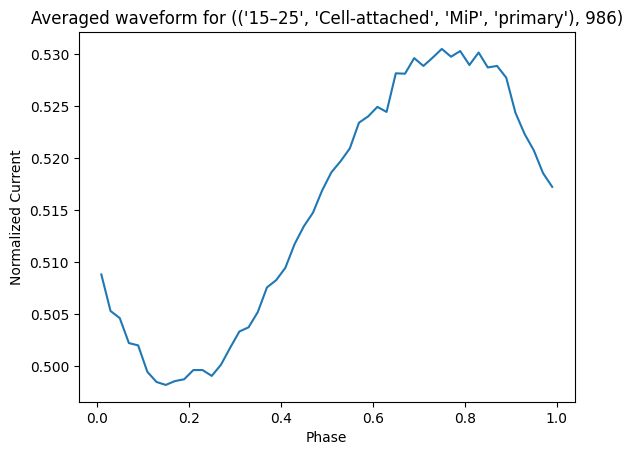

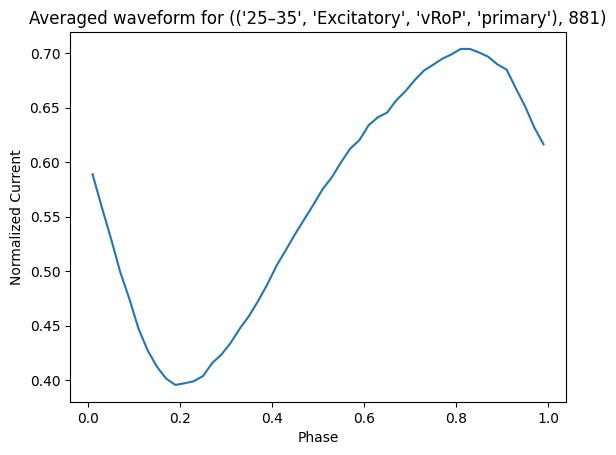

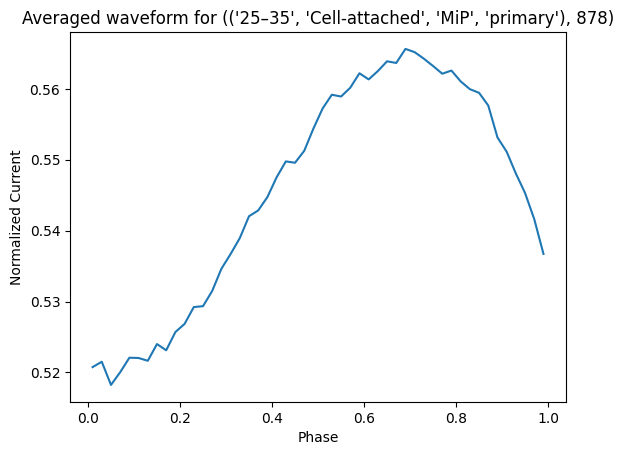

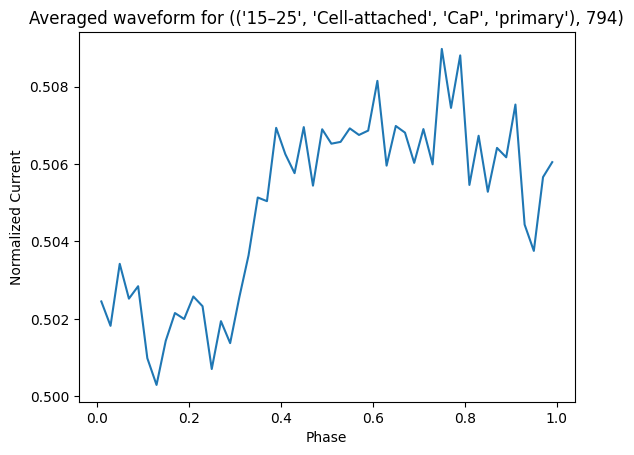

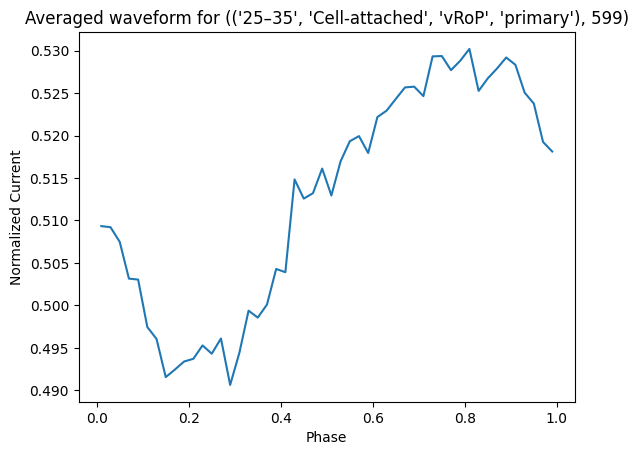

...

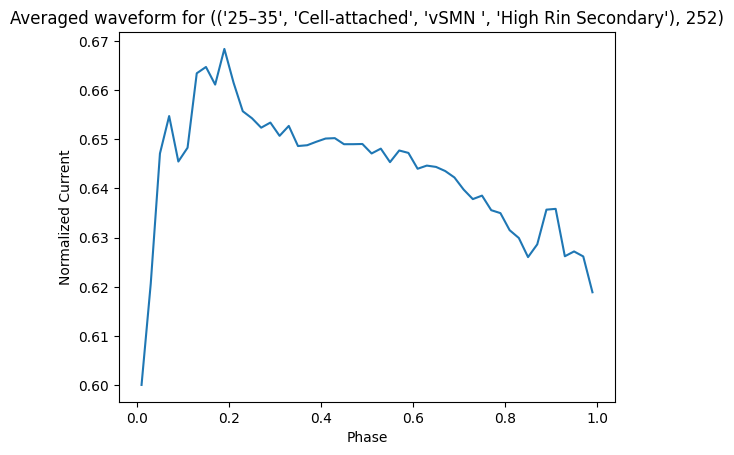

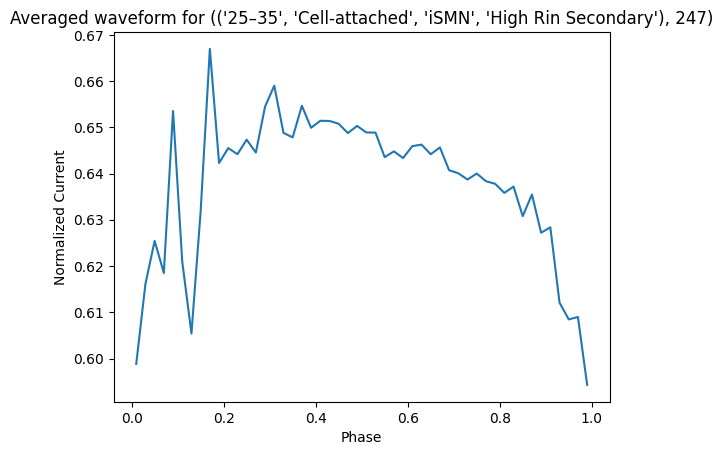

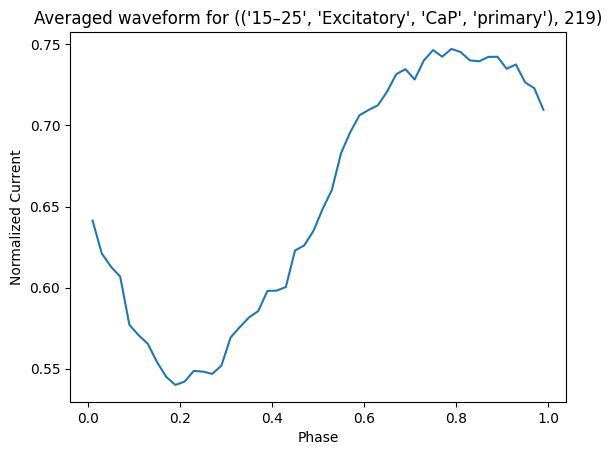

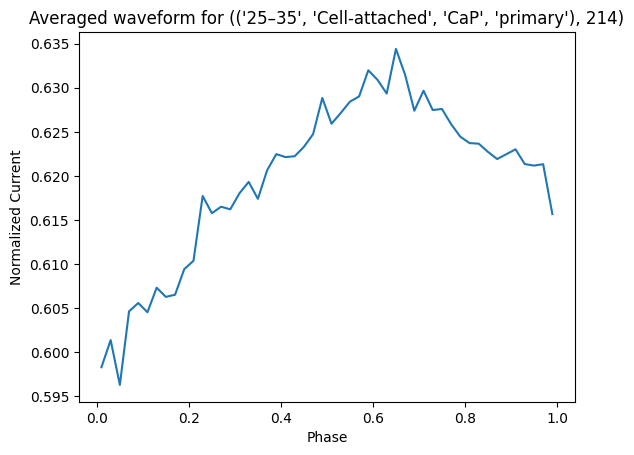

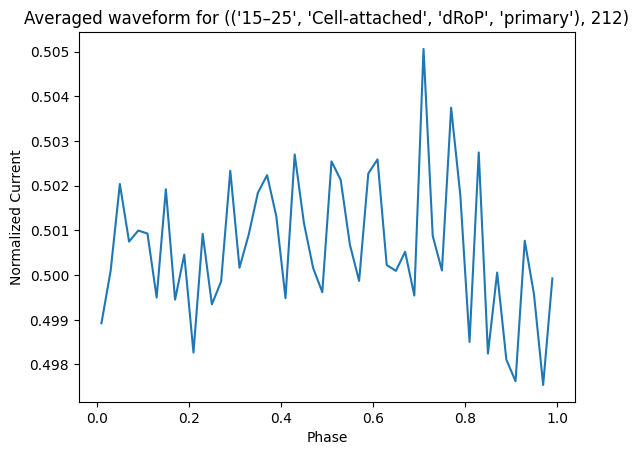

No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')


TypeError: 'NoneType' object is not subscriptable

In [ ]:
for key in key_counts.most_common():
    # print(key[0])
    avg_waveform_df = average_waveforms_for_key(key[0])
    plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'])
    plt.xlabel('Phase')
    plt.ylabel('Normalized Current')
    plt.title(f'Averaged waveform for {key}')
    plt.show()